# Common

In [ ]:
import matplotlib.pyplot as plt

def visualize_training(history_data):
    train_acc = history_data["train_accuracy"]
    val_acc = history_data["val_accuracy"]
    train_loss = history_data["train_loss"]
    val_loss = history_data["val_loss"]

    epochs = range(1, len(train_acc) + 1)

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_acc, label='Training Accuracy', color='#9B5DE5', linestyle='-', linewidth=2.5, marker='o', markersize=5)
    plt.plot(epochs, val_acc, label='Validation Accuracy', color='#F15BB5', linestyle='--', linewidth=2.5, marker='s', markersize=5)
    plt.title('Training and Validation Accuracy', fontsize=14, fontweight='bold', color='#5F0F40')
    plt.xlabel('Epochs', fontsize=12, fontweight='bold', color='#9D4EDD')
    plt.ylabel('Accuracy', fontsize=12, fontweight='bold', color='#9D4EDD')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)

    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_loss, label='Training Loss', color='#00BBF9', linestyle='-', linewidth=2.5, marker='o', markersize=5)
    plt.plot(epochs, val_loss, label='Validation Loss', color='#00F5D4', linestyle='--', linewidth=2.5, marker='s', markersize=5)
    plt.title('Training and Validation Loss', fontsize=14, fontweight='bold', color='#5F0F40')
    plt.xlabel('Epochs', fontsize=12, fontweight='bold', color='#9D4EDD')
    plt.ylabel('Loss', fontsize=12, fontweight='bold', color='#9D4EDD')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

In [ ]:
def create_confusion_matrix(model, test_generator, model_name):
    class_indices = test_generator.class_indices
    class_names = list(class_indices.keys())

    test_generator.reset()

    y_pred = []
    y_true = []

    steps = test_generator.samples // BATCH_SIZE + (1 if test_generator.samples % BATCH_SIZE > 0 else 0)

    for i in range(steps):
        x_batch, y_batch = next(test_generator)
        pred_batch = model.predict(x_batch)
        y_pred.extend(np.argmax(pred_batch, axis=1))
        y_true.extend(np.argmax(y_batch, axis=1))

        if len(y_true) >= test_generator.samples:
            break

    y_true = y_true[:test_generator.samples]
    y_pred = y_pred[:test_generator.samples]

    from sklearn.metrics import confusion_matrix, classification_report
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(10, 8))
    import seaborn as sns
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'{model_name} - Confusion Matrix')
    plt.tight_layout()
    plt.savefig(f"{model_name}_confusion_matrix.png")
    plt.close()

    report = classification_report(y_true, y_pred, target_names=class_names)
    print(f"\n{model_name} Classification Report:")
    print(report)

    with open(f"{model_name}_classification_report.txt", 'w') as f:
        f.write(report)

# Tensorflow

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import tensorflow as tf

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import os
from tqdm import tqdm
import shutil
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from distutils.dir_util import copy_tree


In [ ]:
MEAN_DATASET_PATH = "/content/mean_normalized_dataset1/"
MEAN_TEST_DATASET_PATH = "/content/test_mean_normalized_dataset/"
MEAN_GOOGLE_DRIVE_DATASET_PATH = "/content/drive/MyDrive/mean_normalized_dataset/"
MEAN_TEST_GOOGLE_DRIVE_DATASET_PATH = "/content/drive/MyDrive/test_mean_normalized_dataset/"

REFLECTED_DATASET_PATH = "/content/reflected_normalized_dataset1/"
REFLECTED_GOOGLE_DRIVE_DATASET_PATH = "/content/drive/MyDrive/reflected_normalized_dataset/"

In [ ]:
copy_tree(MEAN_GOOGLE_DRIVE_DATASET_PATH, MEAN_DATASET_PATH)
copy_tree(MEAN_TEST_GOOGLE_DRIVE_DATASET_PATH, MEAN_TEST_DATASET_PATH)
pass

In [ ]:
copy_tree(REFLECTED_GOOGLE_DRIVE_DATASET_PATH, REFLECTED_DATASET_PATH)
pass

In [ ]:
IMG_SIZE = (128, 128)
BATCH_SIZE = 16

In [ ]:
def create_simple_cnn_model(self, classes):
  self.model = keras.Sequential([
          layers.Conv2D(32, (3, 3), activation='relu', input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3)),
          layers.MaxPooling2D((2, 2)),
          layers.Conv2D(64, (3, 3), activation='relu'),
          layers.MaxPooling2D((2, 2)),
          layers.Conv2D(128, (3, 3), activation='relu'),
          layers.MaxPooling2D((2, 2)),
          layers.Flatten(),
          layers.Dense(128, activation='relu'),
          layers.Dropout(0.5),
          layers.Dense(classes, activation='softmax')
      ])
  self.model.compile(optimizer='adam',
            loss='categorical_crossentropy',
            metrics=['accuracy'])

In [ ]:
class Model():
  def __init__(self, model_creator=create_simple_cnn_model):
      self.epoch = 0
      self.history = []
      if USE_TPU:
        with strategy.scope():
          self.model, self.base_model = model_creator()
      else:
        self.model, self.base_model = model_creator()

  def train(self, train_gen, val_gen, epochs_num = 10, callbacks = []):
      history = self.model.fit(
              train_gen,
              validation_data=val_gen,
              initial_epoch=self.epoch,
              epochs=epochs_num + self.epoch,
              callbacks=callbacks
      )
      self.epoch += len(history.epoch)
      self.history.append(history)

  def get_training_history(self):
      train_acc = []
      val_acc = []
      train_loss = []
      val_loss = []

      for h in self.history:
          train_acc.extend(h.history['accuracy'])
          val_acc.extend(h.history['val_accuracy'])
          train_loss.extend(h.history['loss'])
          val_loss.extend(h.history['val_loss'])

      return {
          "train_accuracy": train_acc,
          "val_accuracy": val_acc,
          "train_loss": train_loss,
          "val_loss": val_loss
      }

  def unfreeze_top_layers(self, n):
      total_layers = len(self.base_model.layers)
      for layer in self.base_model.layers[:total_layers - n]:
          layer.trainable = False
      for layer in self.base_model.layers[total_layers - n:]:
          layer.trainable = True


In [ ]:
mean_train_val_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    rotation_range=30,
    width_shift_range=0.15,
    height_shift_range=0.15,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    validation_split=0.2
)

mean_train_generator = mean_train_val_datagen.flow_from_directory(
    MEAN_DATASET_PATH,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training'
)

mean_val_generator = mean_train_val_datagen.flow_from_directory(
    MEAN_DATASET_PATH,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation'
)


mean_test_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
)


mean_test_generator = mean_test_datagen.flow_from_directory(
    MEAN_TEST_DATASET_PATH,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

NUM_CLASSES = len(mean_train_generator.class_indices)
print("classes:", NUM_CLASSES)

Found 636 images belonging to 5 classes.
Found 110 images belonging to 5 classes.
Found 87 images belonging to 5 classes.
classes: 5


In [ ]:
reflected_train_val_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    rotation_range=30,
    width_shift_range=0.15,
    height_shift_range=0.15,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    validation_split=0.2
)

reflected_train_generator = reflected_train_val_datagen.flow_from_directory(
    REFLECTED_DATASET_PATH,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training'
)

reflected_val_generator = reflected_train_val_datagen.flow_from_directory(
    REFLECTED_DATASET_PATH,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation'
)

NUM_CLASSES = len(reflected_train_generator.class_indices)
print("classes:", NUM_CLASSES)

In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, models, optimizers, callbacks, losses, metrics
from tensorflow.keras.optimizers.schedules import CosineDecayRestarts

def create_mobilenet_model(classes):
    base_model = MobileNetV2(input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3), include_top=False, weights='imagenet')
    base_model.trainable = True
    for layer in base_model.layers:
        layer.trainable = False

    model = models.Sequential([
        base_model,
        layers.Flatten(),
        layers.Dense(256, activation='relu'),
        layers.Dense(128, activation='relu'),
        layers.Dense(64, activation='relu'),
        layers.Dense(classes, activation='softmax')
    ])
    # lr_schedule = CosineDecayRestarts(
    #       initial_learning_rate=0.00001,
    #       first_decay_steps=10,
    #       t_mul=2.0,
    #       m_mul=0.9,
    #       alpha=0.00001
    #   )
    # optimizer = optimizers.AdamW(learning_rate=lr_schedule, weight_decay=1e-5, amsgrad=True)

    model.compile(
        optimizer=optimizers.Adam(0.001),
        loss=losses.CategoricalCrossentropy(),
        metrics=[
            metrics.CategoricalAccuracy(name='accuracy'),
            metrics.Precision(name='precision'),
            metrics.Recall(name='recall'),
            metrics.AUC(name='auc'),
            metrics.TopKCategoricalAccuracy(k=2, name='top_2_accuracy')
        ]
    )

    return model, base_model

In [ ]:
from tensorflow.keras.applications import DenseNet121, DenseNet169

def create_densenet_model(classes):
    inputs = layers.Input(shape=(IMG_SIZE[0], IMG_SIZE[1], 3))

    base_model = DenseNet121(input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3), include_top=False, weights='imagenet')
    base_model.trainable = True
    for layer in base_model.layers:
        layer.trainable = False
    x = base_model(inputs)

    model = models.Sequential([
      base_model,
      layers.Flatten(),
      layers.Dropout(0.4),
      layers.Dense(128, activation='relu'),
      layers.Dense(64, activation='relu'),
      layers.Dense(32, activation='relu'),
      layers.Dense(classes, activation='softmax')
    ])
    # lr_schedule = CosineDecayRestarts(
    #       initial_learning_rate=0.00001,
    #       first_decay_steps=5,
    #       t_mul=2.0,
    #       m_mul=0.9,
    #       alpha=0.00001
    #   )
    # optimizer = optimizers.AdamW(learning_rate=lr_schedule, amsgrad=True)
    model.compile(
        optimizer=optimizers.Adam(0.001),
        loss=losses.CategoricalCrossentropy(),
        metrics=[
            metrics.CategoricalAccuracy(name='accuracy'),
            metrics.Precision(name='precision'),
            metrics.Recall(name='recall'),
            metrics.AUC(name='auc'),
            metrics.TopKCategoricalAccuracy(k=2, name='top_2_accuracy')
        ]
    )
    # model.compile(
    #     optimizer=optimizer,
    #     loss=losses.CategoricalCrossentropy(label_smoothing=0.1),
    #     metrics=[
    #         metrics.CategoricalAccuracy(name='accuracy'),
    #         metrics.Precision(name='precision'),
    #         metrics.Recall(name='recall'),
    #         metrics.AUC(name='auc'),
    #         metrics.TopKCategoricalAccuracy(k=2, name='top_2_accuracy')
    #     ]
    # )

    return model, base_model

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=11,
    restore_best_weights=True
)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.65, patience=3, min_lr=1e-7, verbose=1)
checkpoint = ModelCheckpoint(
    filepath=os.path.join("checkpoint", f"model_best.h5"),
    monitor='val_accuracy',
    save_best_only=True,
    mode='max'
)


In [ ]:
mobile_net_model = Model(lambda: create_mobilenet_model(NUM_CLASSES))

In [ ]:
mobile_net_model.train(mean_train_generator, mean_val_generator, 10, callbacks=[early_stopping])


Epoch 1/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 22s 333ms/step - accuracy: 0.3241 - auc: 0.6424 - loss: 2.6020 - precision: 0.3651 - recall: 0.2714 - top_2_accuracy: 0.5607 - val_accuracy: 0.5091 - val_auc: 0.7889 - val_loss: 1.3893 - val_precision: 0.5402 - val_recall: 0.4273 - val_top_2_accuracy: 0.6909
Epoch 2/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - accuracy: 0.5323 - auc: 0.8161 - loss: 1.2804 - precision: 0.6219 - recall: 0.4606 - top_2_accuracy: 0.7560 - val_accuracy: 0.5091 - val_auc: 0.8036 - val_loss: 1.3195 - val_precision: 0.5412 - val_recall: 0.4182 - val_top_2_accuracy: 0.7545
Epoch 3/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - accuracy: 0.5759 - auc: 0.8484 - loss: 1.1550 - precision: 0.5999 - recall: 0.4872 - top_2_accuracy: 0.8133 - val_accuracy: 0.5727 - val_auc: 0.8602 - val_loss: 1.0480 - val_precision: 0.7188 - val_recall: 0.4182 - val_top_2_accuracy: 0.8091
Epoch 4/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - accuracy: 0.6097 - auc: 0.8846 - loss: 0.9571 - precision: 

In [ ]:
visualize_training(mobile_net_model.get_training_history())

In [ ]:
mobile_net_model.train(mean_train_generator, mean_val_generator, 50, callbacks=[early_stopping, reduce_lr])

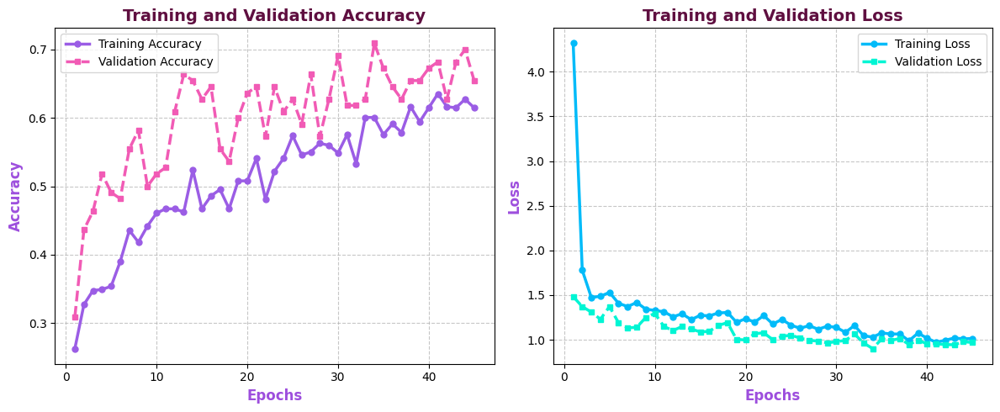

In [ ]:
visualize_training(mobile_net_model.get_training_history())

In [ ]:
len(mobile_net_model.base_model.layers)

154

In [ ]:
mobile_net_model.unfreeze_top_layers(int(len(mobile_net_model.base_model.layers)*0.15))
len([l for l in mobile_net_model.base_model.layers if l.trainable])

23

In [ ]:
mobile_net_model.train(mean_train_generator, mean_val_generator, 50, callbacks=[checkpoint, early_stopping, reduce_lr])

Epoch 46/95
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.5978 - auc: 0.8593 - loss: 1.0552 - precision: 0.8041 - recall: 0.3615 - top_2_accuracy: 0.7837

40/40 ━━━━━━━━━━━━━━━━━━━━ 4s 107ms/step - accuracy: 0.5975 - auc: 0.8593 - loss: 1.0553 - precision: 0.8038 - recall: 0.3613 - top_2_accuracy: 0.7837 - val_accuracy: 0.6636 - val_auc: 0.9040 - val_loss: 0.9541 - val_precision: 0.8163 - val_recall: 0.3636 - val_top_2_accuracy: 0.8636 - learning_rate: 1.1603e-04
Epoch 47/95
40/40 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - accuracy: 0.6032 - auc: 0.8597 - loss: 1.0346 - precision: 0.7887 - recall: 0.4101 - top_2_accuracy: 0.7696 - val_accuracy: 0.6545 - val_auc: 0.8900 - val_loss: 0.9995 - val_precision: 0.7857 - val_recall: 0.4000 - val_top_2_accuracy: 0.8455 - learning_rate: 1.1603e-04
Epoch 48/95
40/40 ━━━━━━━━━━━━━━━━━━━━ 5s 117ms/step - accuracy: 0.6471 - auc: 0.8792 - loss: 0.9725 - precision: 0.8527 - recall: 0.4121 - top_2_accuracy: 0.7955 - val_accuracy: 0.6455 - val_auc: 0.8975 - val_loss: 0.9497 - val_precision: 0.7736 - val_recall: 0.3727 - val_top_2_accuracy: 0.8727 - learning_rate: 1.1603e-04
Epoch 49/95
40/40 ━━━━━━━━━━━━━━━━━━━━

40/40 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - accuracy: 0.6277 - auc: 0.8783 - loss: 0.9655 - precision: 0.8034 - recall: 0.4278 - top_2_accuracy: 0.8024 - val_accuracy: 0.7091 - val_auc: 0.9225 - val_loss: 0.8887 - val_precision: 0.9149 - val_recall: 0.3909 - val_top_2_accuracy: 0.8727 - learning_rate: 7.5419e-05
Epoch 54/95
40/40 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - accuracy: 0.5986 - auc: 0.8643 - loss: 1.0395 - precision: 0.8041 - recall: 0.4090 - top_2_accuracy: 0.7961 - val_accuracy: 0.6909 - val_auc: 0.9044 - val_loss: 0.9226 - val_precision: 0.8333 - val_recall: 0.4091 - val_top_2_accuracy: 0.8455 - learning_rate: 7.5419e-05
Epoch 55/95
40/40 ━━━━━━━━━━━━━━━━━━━━ 5s 105ms/step - accuracy: 0.6421 - auc: 0.8850 - loss: 0.9339 - precision: 0.8243 - recall: 0.4532 - top_2_accuracy: 0.8084 - val_accuracy: 0.6909 - val_auc: 0.9049 - val_loss: 0.9279 - val_precision: 0.8246 - val_recall: 0.4273 - val_top_2_accuracy: 0.8727 - learning_rate: 7.5419e-05
Epoch 56/95
40/40 ━━━━━━━━━━━━━━━━━━━

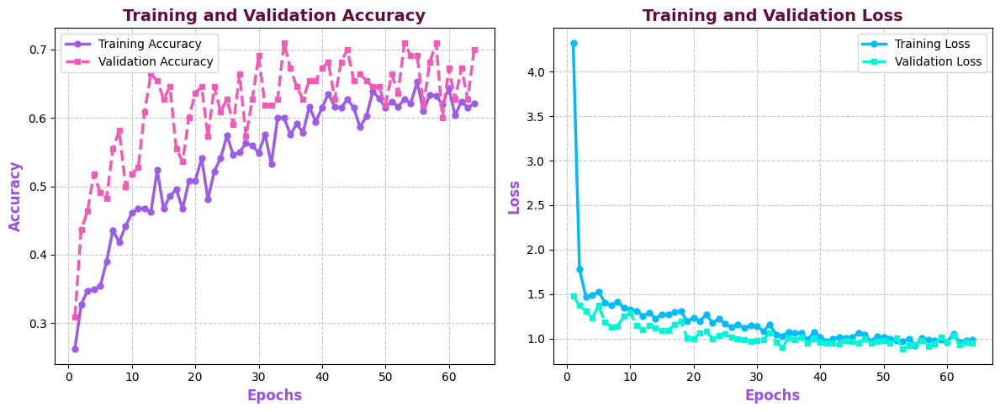

In [ ]:
visualize_training(mobile_net_model.get_training_history())

In [ ]:
dense_net_model = Model(lambda: create_densenet_model(NUM_CLASSES))


In [ ]:
dense_net_model.train(mean_train_generator, mean_val_generator, 50, callbacks=[early_stopping, reduce_lr])


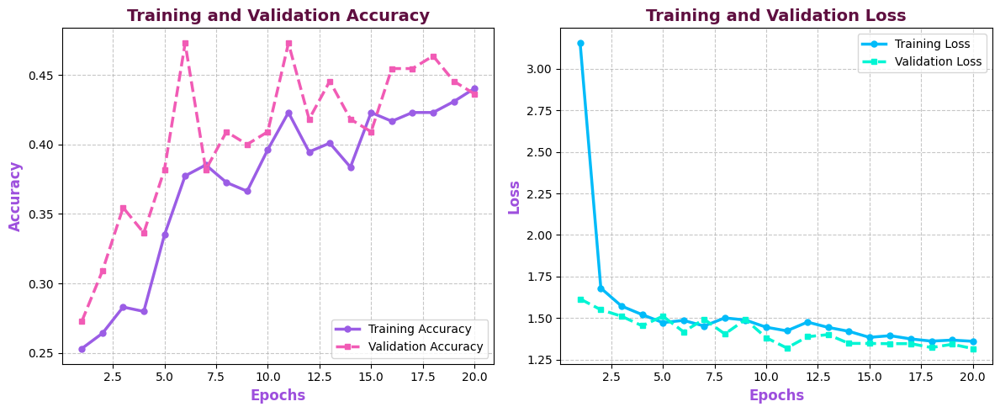

In [ ]:
visualize_training(dense_net_model.get_training_history())

In [ ]:
l

0

In [ ]:
dense_net_model.unfreeze_top_layers(int(len(dense_net_model.base_model.layers)*0.30))
len([l for l in dense_net_model.base_model.layers if l.trainable])

178

In [ ]:
dense_net_model.train(mean_train_generator, mean_val_generator, 50, callbacks=[early_stopping, reduce_lr])

In [ ]:
visualize_training(dense_net_model.get_training_history())

In [ ]:
dense_net_model.train(mean_train_generator, mean_val_generator, 20)

20
Epoch 21/40
12/12 ━━━━━━━━━━━━━━━━━━━━ 5s 386ms/step - accuracy: 0.7755 - loss: 0.6304 - val_accuracy: 0.6806 - val_loss: 0.7266
Epoch 22/40
12/12 ━━━━━━━━━━━━━━━━━━━━ 4s 352ms/step - accuracy: 0.7195 - loss: 0.6694 - val_accuracy: 0.6076 - val_loss: 1.0346
Epoch 23/40
12/12 ━━━━━━━━━━━━━━━━━━━━ 4s 344ms/step - accuracy: 0.6456 - loss: 0.7812 - val_accuracy: 0.7361 - val_loss: 0.7993
Epoch 24/40
12/12 ━━━━━━━━━━━━━━━━━━━━ 4s 346ms/step - accuracy: 0.7778 - loss: 0.5981 - val_accuracy: 0.5694 - val_loss: 1.0606
Epoch 25/40
12/12 ━━━━━━━━━━━━━━━━━━━━ 4s 347ms/step - accuracy: 0.7559 - loss: 0.6861 - val_accuracy: 0.5833 - val_loss: 0.9612
Epoch 26/40
12/12 ━━━━━━━━━━━━━━━━━━━━ 5s 420ms/step - accuracy: 0.7188 - loss: 0.7244 - val_accuracy: 0.5556 - val_loss: 0.9781
Epoch 27/40
12/12 ━━━━━━━━━━━━━━━━━━━━ 5s 361ms/step - accuracy: 0.7873 - loss: 0.5647 - val_accuracy: 0.7257 - val_loss: 0.7078
Epoch 28/40
12/12 ━━━━━━━━━━━━━━━━━━━━ 4s 348ms/step - accuracy: 0.6921 - loss: 0.7164 - val_a

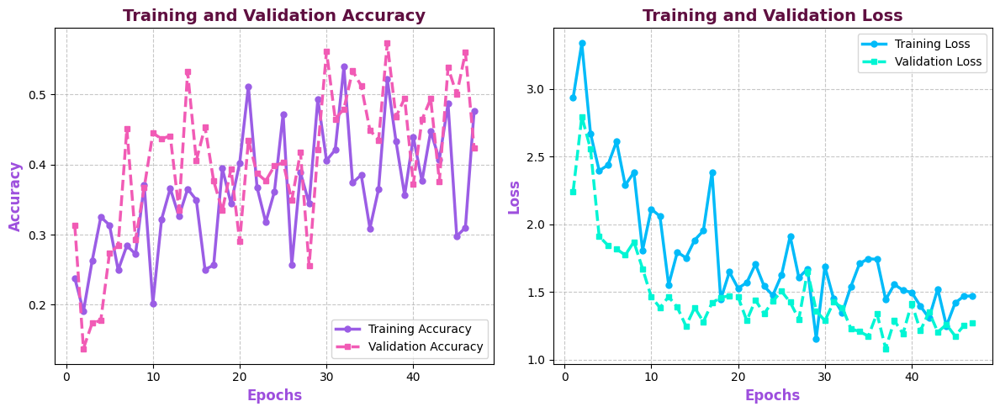

In [ ]:
visualize_training(dense_net_model.get_training_history())

In [ ]:
mobile_net_model_1.train(my_train_generator, my_val_generator, 20)

In [ ]:
import os

def save_model(model, path, model_name):
    os.makedirs(path, exist_ok=True)

    model_json = model.to_json()
    json_path = os.path.join(path, f"{model_name}_architecture.json")
    with open(json_path, "w") as json_file:
        json_file.write(model_json)

    weights_path = os.path.join(path, f"{model_name}_weights.h5")
    model.save_weights(weights_path)

    print(f"Model saved successfully at {path} as {model_name}_architecture.json and {model_name}_weights.h5")


In [ ]:

if USE_TPU:
  with strategy.scope():
    test_model = models.Sequential([
          layers.Input(shape=(IMG_SIZE[0], IMG_SIZE[1], 3)),
          layers.Conv2D(128, (3, 3), activation='relu'),
          layers.MaxPooling2D((2, 2)),
          layers.Conv2D(64, (3, 3), activation='relu'),
          layers.MaxPooling2D((2, 2)),
          layers.Conv2D(32, (3, 3), activation='relu'),
          layers.MaxPooling2D((2, 2)),
          layers.Flatten(),
          layers.Dense(128, activation='relu'),
          layers.Dropout(0.5),
          layers.Dense(NUM_CLASSES, activation='softmax')
      ])
    test_model.compile(
      optimizer=optimizers.Adam(0.000006),
      loss=losses.CategoricalCrossentropy(),
      metrics=[
          metrics.CategoricalAccuracy(name='accuracy'),
          metrics.Precision(name='precision'),
          metrics.Recall(name='recall'),
          metrics.AUC(name='auc'),
          metrics.TopKCategoricalAccuracy(k=2, name='top_2_accuracy')
      ]
    )

# Tensorflow

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import tensorflow as tf

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import os
from tqdm import tqdm
import shutil
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121, MobileNetV2, EfficientNetB0
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from distutils.dir_util import copy_tree


In [ ]:
TRAIN_DATASET_PATH = "/content/train_dataset/"
VAL_DATASET_PATH = "/content/val_dataset/"
TEST_DATASET_PATH = "/content/test_dataset/"
TRAIN_GOOGLE_DRIVE_DATASET_PATH = "/content/drive/MyDrive/train_augmented_normalized_dataset/"
VAL_GOOGLE_DRIVE_DATASET_PATH = "/content/drive/MyDrive/val_augmented_normalized_dataset/"
TEST_GOOGLE_DRIVE_DATASET_PATH = "/content/drive/MyDrive/test_augmented_normalized_dataset/"

In [ ]:
copy_tree(TRAIN_GOOGLE_DRIVE_DATASET_PATH, TRAIN_DATASET_PATH)
copy_tree(VAL_GOOGLE_DRIVE_DATASET_PATH, VAL_DATASET_PATH)
pass

In [ ]:
copy_tree(TEST_GOOGLE_DRIVE_DATASET_PATH, TEST_DATASET_PATH)
pass

In [ ]:
IMG_SIZE = (128, 128)
BATCH_SIZE = 16

In [ ]:
SEED = 415

tf.random.set_seed(SEED)
np.random.seed(SEED)

In [ ]:
mean_train_val_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
)

mean_train_generator = mean_train_val_datagen.flow_from_directory(
    TRAIN_DATASET_PATH,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training'
)

mean_val_generator = mean_train_val_datagen.flow_from_directory(
    VAL_DATASET_PATH,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation'
)


mean_test_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
)


mean_test_generator = mean_test_datagen.flow_from_directory(
    TEST_DATASET_PATH,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

NUM_CLASSES = len(mean_train_generator.class_indices)
print("classes:", NUM_CLASSES)

In [ ]:
def create_densenet_model():
    base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(*IMG_SIZE, 3))
    base_model.trainable = True
    for layer in base_model.layers:
        layer.trainable = False

    x = base_model.output
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(256, activation='relu')(x)
    x = layers.Dropout(0.4)(x)
    x = layers.Dense(128, activation='relu')(x)
    predictions = layers.Dense(NUM_CLASSES, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model, base_model, 'densenet121'

In [ ]:
def create_mobilenet_model():
    base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(*IMG_SIZE, 3))
    base_model.trainable = True
    for layer in base_model.layers:
        layer.trainable = False

    x = base_model.output
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(256, activation='relu')(x)
    x = layers.Dropout(0.4)(x)
    x = layers.Dense(128, activation='relu')(x)
    predictions = layers.Dense(NUM_CLASSES, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model, base_model, 'mobilenetv2'

In [ ]:
def create_efficientnet_model():
    base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(*IMG_SIZE, 3))
    base_model.trainable = True
    for layer in base_model.layers:
        layer.trainable = False

    x = base_model.output
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(256, activation='sigmoid')(x)
    x = layers.Dropout(0.4)(x)
    x = layers.Dense(128, activation='relu')(x)
    predictions = Dense(NUM_CLASSES, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model, base_model, "efficientnetb0"

In [ ]:
EPOCHS = 50

In [ ]:
def train_model_with_fine_tuning(model, base_model, model_name, train_gen, val_gen, test_gen):
    checkpoint_dir = f"checkpoints{model_name}"
    os.makedirs(checkpoint_dir, exist_ok=True)

    checkpoint = ModelCheckpoint(
        filepath=os.path.join(checkpoint_dir, f"{model_name}_best.h5"),
        monitor='val_accuracy',
        save_best_only=True,
        mode='max'
    )

    early_stopping = EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True
    )

    reduce_lr = ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.8,
        patience=3,
        min_lr=1e-5
    )

    callbacks = [checkpoint, early_stopping, reduce_lr]

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    print(f"Phase 1: Training top layers of {model_name}")
    history1 = model.fit(
        train_gen,
        steps_per_epoch=train_gen.samples // BATCH_SIZE,
        validation_data=val_gen,
        validation_steps=val_gen.samples // BATCH_SIZE,
        epochs=EPOCHS,
        callbacks=callbacks
    )

    print(f"Phase 2: Fine-tuning {model_name}")

    total_layers = len(base_model.layers)
    unfreeze_layers = int(total_layers * 0.2)
    for layer in base_model.layers[-unfreeze_layers:]:
        layer.trainable = True

    print(f"Total layers in base model: {total_layers}")
    print(f"Unfreezing last {unfreeze_layers} layers")

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    history2 = model.fit(
        train_gen,
        steps_per_epoch=train_gen.samples // BATCH_SIZE,
        validation_data=val_gen,
        validation_steps=val_gen.samples // BATCH_SIZE,
        epochs=len(history1.history['accuracy'])+EPOCHS,
        callbacks=callbacks,
        initial_epoch=len(history1.history['accuracy'])
    )


    print(f"Phase 3: Fine-tuning {model_name}")

    total_layers = len(base_model.layers)
    unfreeze_layers = int(total_layers * 0.4)
    for layer in base_model.layers[-unfreeze_layers:]:
        layer.trainable = True

    print(f"Total layers in base model: {total_layers}")
    print(f"Unfreezing last {unfreeze_layers} layers")

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=5e-5),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    history3 = model.fit(
        train_gen,
        steps_per_epoch=train_gen.samples // BATCH_SIZE,
        validation_data=val_gen,
        validation_steps=val_gen.samples // BATCH_SIZE,
        epochs=len(history1.history['accuracy'])+EPOCHS,
        callbacks=callbacks,
        initial_epoch=len(history1.history['accuracy']+ history2.history['accuracy'])
    )


    combined_history = {
        'accuracy': history1.history['accuracy'] + history2.history['accuracy'] + history3.history['accuracy'],
        'val_accuracy': history1.history['val_accuracy'] + history2.history['val_accuracy'] + history3.history['val_accuracy'],
        'loss': history1.history['loss'] + history2.history['loss'] + history3.history['loss'],
        'val_loss': history1.history['val_loss'] + history2.history['val_loss'] + history3.history['val_loss']
    }

    test_results = model.evaluate(test_gen, steps=test_gen.samples // BATCH_SIZE)
    print(f"{model_name} Test Loss: {test_results[0]:.4f}")
    print(f"{model_name} Test Accuracy: {test_results[1]:.4f}")

    visualize_training(combined_history)

    create_confusion_matrix(model, test_gen, model_name)

    return model, combined_history, test_results

Phase 1: Training top layers of densenet121
Epoch 1/25
37/37 ━━━━━━━━━━━━━━━━━━━━ 47s 657ms/step - accuracy: 0.3022 - loss: 2.4716 - val_accuracy: 0.4236 - val_loss: 1.3008 - learning_rate: 3.0000e-04
Epoch 2/25
 1/37 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - accuracy: 0.3125 - loss: 1.4898

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.3125 - loss: 1.4898 - val_accuracy: 0.4583 - val_loss: 1.2245 - learning_rate: 3.0000e-04
Epoch 3/25
37/37 ━━━━━━━━━━━━━━━━━━━━ 10s 280ms/step - accuracy: 0.4503 - loss: 1.4491 - val_accuracy: 0.5972 - val_loss: 1.1312 - learning_rate: 3.0000e-04
Epoch 4/25
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.3750 - loss: 1.5165 - val_accuracy: 0.5556 - val_loss: 1.1242 - learning_rate: 3.0000e-04
Epoch 5/25
37/37 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - accuracy: 0.5125 - loss: 1.2641 - val_accuracy: 0.5278 - val_loss: 1.0460 - learning_rate: 3.0000e-04
Epoch 6/25
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - accuracy: 0.5000 - loss: 0.9243 - val_accuracy: 0.5903 - val_loss: 0.9840 - learning_rate: 3.0000e-04
Epoch 7/25
37/37 ━━━━━━━━━━━━━━━━━━━━ 7s 104ms/step - accuracy: 0.5535 - loss: 1.0833 - val_accuracy: 0.5972 - val_loss: 1.0386 - learning_rate: 3.0000e-04
Epoch 8/25
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5625 - loss:

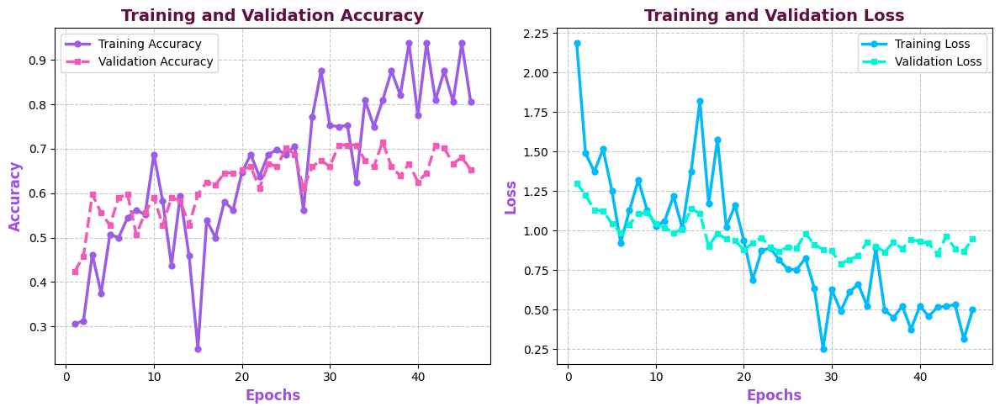

1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step

densenet121 Classification Report:
                precision    recall  f1-score   support

         clear       0.90      0.90      0.90        20
        comedo       0.84      0.80      0.82        20
 nodule-cystic       0.78      1.00      0.88         7
         other       0.94      0.85      0.89        20
papulo-pustula       0.81      0.85      0.83        20

      accuracy                           0.86        87
     macro avg       0.85      0.88      0.86        87
  weighted avg       0.87      0.86      0.86        87

Phase 1: Training top layers of mobilenetv2
Epoch 1/25
37/37 ━━━━━━━━━━━━━━━━━━━━ 19s 279ms/step - accuracy: 0.2769 - loss: 2.6650 - val_accuracy: 0.4514 - val_loss: 1.3564 - learning_rate: 3.0000e-04
Epoch 2/25
 1/37 ━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - accuracy: 0.3125 - loss: 1.5140 - val_accuracy: 0.4375 - val_loss: 1.3314 - learning_rate: 3.0000e-04
Epoch 3/25
37/37 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - accuracy: 0.4618 - loss: 1.4485 - val_accuracy: 0.5000 - val_loss: 1.2133 - learning_rate: 3.0000e-04
Epoch 4/25
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - accuracy: 0.4375 - loss: 1.9296 - val_accuracy: 0.5208 - val_loss: 1.1924 - learning_rate: 3.0000e-04
Epoch 5/25
37/37 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - accuracy: 0.5347 - loss: 1.1499 - val_accuracy: 0.5903 - val_loss: 1.0793 - learning_rate: 3.0000e-04
Epoch 6/25
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - accuracy: 0.3750 - loss: 1.2767 - val_accuracy: 0.5972 - val_loss: 1.0163 - learning_rate: 3.0000e-04
Epoch 7/25
37/37 ━━━━━━━━━━━━━━━━━━━━ 5s 143ms/step - accuracy: 0.5021 - loss: 1.1832 - val_accuracy: 0.6250 - val_loss: 1.0255 - learning_rate: 3.0000e-04
Epoch 8/25
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - accuracy: 0.4375 - loss: 

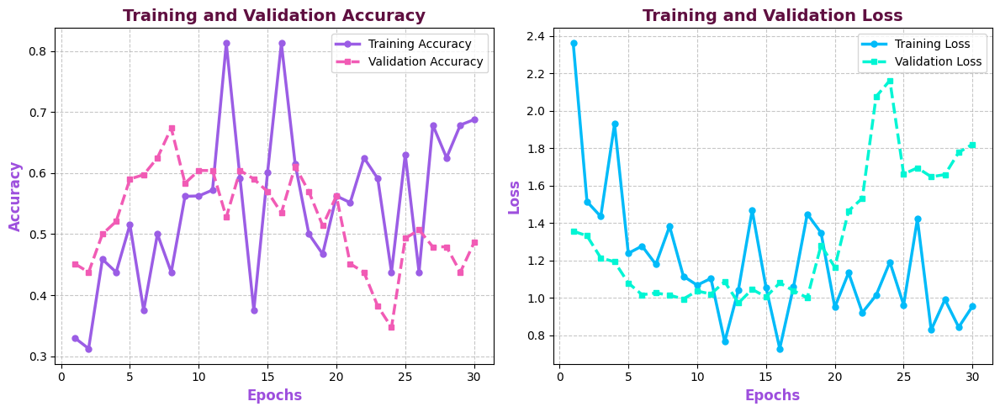

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))



mobilenetv2 Classification Report:
                precision    recall  f1-score   support

         clear       0.52      0.85      0.64        20
        comedo       0.41      0.45      0.43        20
 nodule-cystic       0.00      0.00      0.00         7
         other       0.83      0.25      0.38        20
papulo-pustula       0.54      0.70      0.61        20

      accuracy                           0.52        87
     macro avg       0.46      0.45      0.41        87
  weighted avg       0.53      0.52      0.47        87

Phase 1: Training top layers of efficientnetb0
Epoch 1/25
37/37 ━━━━━━━━━━━━━━━━━━━━ 48s 615ms/step - accuracy: 0.2452 - loss: 2.2160 - val_accuracy: 0.2083 - val_loss: 1.5703 - learning_rate: 3.0000e-04
Epoch 2/25
 1/37 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.2500 - loss: 1.5313

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.2500 - loss: 1.5313 - val_accuracy: 0.2083 - val_loss: 1.5807 - learning_rate: 3.0000e-04
Epoch 3/25
37/37 ━━━━━━━━━━━━━━━━━━━━ 8s 106ms/step - accuracy: 0.2582 - loss: 1.6364 - val_accuracy: 0.2708 - val_loss: 1.5452 - learning_rate: 3.0000e-04
Epoch 4/25
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.1875 - loss: 1.5944 - val_accuracy: 0.2847 - val_loss: 1.5434 - learning_rate: 3.0000e-04
Epoch 5/25
37/37 ━━━━━━━━━━━━━━━━━━━━ 5s 140ms/step - accuracy: 0.2477 - loss: 1.5929 - val_accuracy: 0.2639 - val_loss: 1.5446 - learning_rate: 3.0000e-04
Epoch 6/25
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.1875 - loss: 1.6589 - val_accuracy: 0.2778 - val_loss: 1.5467 - learning_rate: 3.0000e-04
Epoch 7/25
37/37 ━━━━━━━━━━━━━━━━━━━━ 5s 142ms/step - accuracy: 0.2325 - loss: 1.5813 - val_accuracy: 0.2917 - val_loss: 1.5410 - learning_rate: 3.0000e-04
Epoch 8/25
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.0625 - loss: 

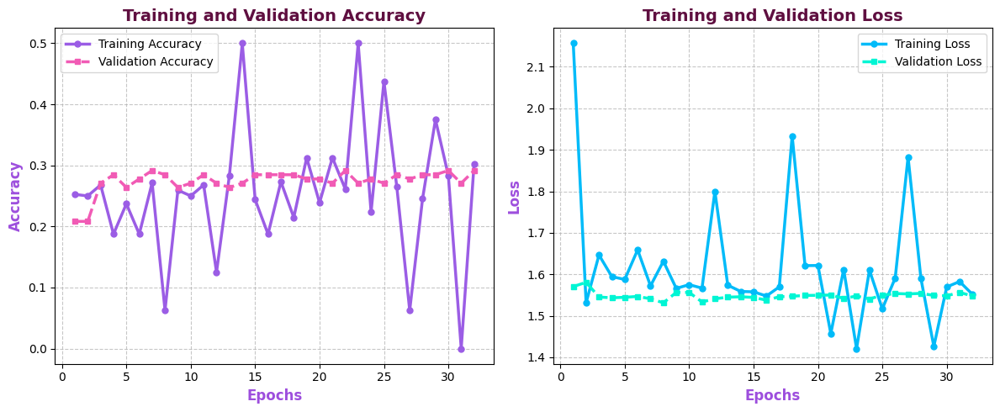

In [ ]:

results = []
densenet_model, base_densenet_model, densenet_name = create_densenet_model()
densenet_model, densenet_history, densenet_results = train_model_with_fine_tuning(
    densenet_model, base_densenet_model, densenet_name, mean_train_generator, mean_val_generator, mean_test_generator
)
results.append((densenet_name, densenet_results[1]))

mobilenet_model, base_mobilenet_model, mobilenet_name = create_mobilenet_model()
mobilenet_model, mobilenet_history, mobilenet_results = train_model_with_fine_tuning(
    mobilenet_model, base_mobilenet_model, mobilenet_name, mean_train_generator, mean_val_generator, mean_test_generator
)
results.append((mobilenet_name, mobilenet_results[1]))

efficientnet_model, base_efficientnet_model, efficientnet_name = create_efficientnet_model()
efficientnet_model, efficientnet_history, efficientnet_results = train_model_with_fine_tuning(
    efficientnet_model, base_efficientnet_model, efficientnet_name, mean_train_generator, mean_val_generator, mean_test_generator
)
results.append((efficientnet_name, efficientnet_results[1]))

results.sort(key=lambda x: x[1], reverse=True)

print("\nModel Performance Comparison (Test Accuracy):")
for model_name, accuracy in results:
    print(f"{model_name}: {accuracy:.4f}")

# Tensorflow

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import tensorflow as tf

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import os
from tqdm import tqdm
import shutil
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121, MobileNetV2, EfficientNetB0
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from distutils.dir_util import copy_tree


In [ ]:
TRAIN_DATASET_PATH = "/content/train_dataset/"
VAL_DATASET_PATH = "/content/val_dataset/"
TEST_DATASET_PATH = "/content/test_dataset/"
TRAIN_GOOGLE_DRIVE_DATASET_PATH = "/content/drive/MyDrive/train_augmented_normalized_dataset/"
VAL_GOOGLE_DRIVE_DATASET_PATH = "/content/drive/MyDrive/val_augmented_normalized_dataset/"
TEST_GOOGLE_DRIVE_DATASET_PATH = "/content/drive/MyDrive/test_augmented_normalized_dataset/"

In [ ]:
copy_tree(TRAIN_GOOGLE_DRIVE_DATASET_PATH, TRAIN_DATASET_PATH)
copy_tree(VAL_GOOGLE_DRIVE_DATASET_PATH, VAL_DATASET_PATH)
pass

In [ ]:
copy_tree(TEST_GOOGLE_DRIVE_DATASET_PATH, TEST_DATASET_PATH)
pass

In [ ]:
copy_tree(VAL_GOOGLE_DRIVE_DATASET_PATH, VAL_DATASET_PATH)
pass

In [ ]:
import matplotlib.pyplot as plt

def visualize_training(history_data):
    train_acc = history_data["accuracy"]
    val_acc = history_data["val_accuracy"]
    train_loss = history_data["loss"]
    val_loss = history_data["val_loss"]

    epochs = range(1, len(train_acc) + 1)

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_acc, label='Training Accuracy', color='#9B5DE5', linestyle='-', linewidth=2.5, marker='o', markersize=5)
    plt.plot(epochs, val_acc, label='Validation Accuracy', color='#F15BB5', linestyle='--', linewidth=2.5, marker='s', markersize=5)
    plt.title('Training and Validation Accuracy', fontsize=14, fontweight='bold', color='#5F0F40')
    plt.xlabel('Epochs', fontsize=12, fontweight='bold', color='#9D4EDD')
    plt.ylabel('Accuracy', fontsize=12, fontweight='bold', color='#9D4EDD')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)

    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_loss, label='Training Loss', color='#00BBF9', linestyle='-', linewidth=2.5, marker='o', markersize=5)
    plt.plot(epochs, val_loss, label='Validation Loss', color='#00F5D4', linestyle='--', linewidth=2.5, marker='s', markersize=5)
    plt.title('Training and Validation Loss', fontsize=14, fontweight='bold', color='#5F0F40')
    plt.xlabel('Epochs', fontsize=12, fontweight='bold', color='#9D4EDD')
    plt.ylabel('Loss', fontsize=12, fontweight='bold', color='#9D4EDD')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()


In [ ]:
IMG_SIZE = (128, 128)
BATCH_SIZE = 32

In [ ]:
SEED = 415

tf.random.set_seed(SEED)
np.random.seed(SEED)

In [ ]:
datagen = ImageDataGenerator(
    rescale=1.0/255.0,
)

train_generator = datagen.flow_from_directory(
    TRAIN_DATASET_PATH,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

val_generator = datagen.flow_from_directory(
    VAL_DATASET_PATH,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

test_generator = datagen.flow_from_directory(
    TEST_DATASET_PATH,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

NUM_CLASSES = len(train_generator.class_indices)
print("classes:", NUM_CLASSES)

In [ ]:
def create_densenet_model():
    base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(*IMG_SIZE, 3))
    base_model.trainable = True
    for layer in base_model.layers:
        layer.trainable = False

    x = base_model.output
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    predictions = layers.Dense(NUM_CLASSES, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model, base_model, 'densenet121'

In [ ]:
def create_mobilenet_model():
    base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(*IMG_SIZE, 3))
    base_model.trainable = True
    for layer in base_model.layers:
        layer.trainable = False

    x = base_model.output
    x = layers.Flatten()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    predictions = layers.Dense(NUM_CLASSES, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model, base_model, 'mobilenetv2'

In [ ]:

def create_confusion_matrix(model, test_generator, model_name):
    class_indices = test_generator.class_indices
    class_names = list(class_indices.keys())

    test_generator.reset()

    y_pred = []
    y_true = []

    steps = test_generator.samples // BATCH_SIZE + (1 if test_generator.samples % BATCH_SIZE > 0 else 0)

    for i in range(steps):
        x_batch, y_batch = next(test_generator)
        pred_batch = model.predict(x_batch)
        y_pred.extend(np.argmax(pred_batch, axis=1))
        y_true.extend(np.argmax(y_batch, axis=1))

        if len(y_true) >= test_generator.samples:
            break

    y_true = y_true[:test_generator.samples]
    y_pred = y_pred[:test_generator.samples]

    from sklearn.metrics import confusion_matrix, classification_report
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(10, 8))
    import seaborn as sns
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'{model_name} - Confusion Matrix')
    plt.tight_layout()
    plt.savefig(f"{model_name}_confusion_matrix.png")
    plt.close()

    report = classification_report(y_true, y_pred, target_names=class_names)
    print(f"\n{model_name} Classification Report:")
    print(report)

    with open(f"{model_name}_classification_report.txt", 'w') as f:
        f.write(report)

In [ ]:
EPOCHS = 50

In [ ]:
def train_model_with_fine_tuning(model, base_model, model_name, train_gen, val_gen, test_gen):
    checkpoint_dir = f"checkpoints"
    os.makedirs(checkpoint_dir, exist_ok=True)

    checkpoint = ModelCheckpoint(
        filepath=os.path.join(checkpoint_dir, f"{model_name}_best.h5"),
        monitor='val_accuracy',
        save_best_only=True,
        mode='max'
    )

    early_stopping = EarlyStopping(
        monitor='val_loss',
        patience=15,
        restore_best_weights=True
    )

    reduce_lr = ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.8,
        patience=5,
        min_lr=1e-6
    )

    callbacks = [checkpoint, early_stopping, reduce_lr]

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=5e-3),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    print(f"Phase 1: Training top layers of {model_name}")
    history1 = model.fit(
        train_gen,
        steps_per_epoch=train_gen.samples // BATCH_SIZE,
        validation_data=val_gen,
        validation_steps=val_gen.samples // BATCH_SIZE,
        epochs=EPOCHS,
        callbacks=callbacks
    )
    if base_model:
      print(f"Phase 2: Fine-tuning {model_name}")

      total_layers = len(base_model.layers)
      unfreeze_layers = int(total_layers * 0.1)
      for layer in base_model.layers[-unfreeze_layers:]:
          layer.trainable = True

      print(f"Total layers in base model: {total_layers}")
      print(f"Unfreezing last {unfreeze_layers} layers")

      model.compile(
          optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
          loss='categorical_crossentropy',
          metrics=['accuracy']
      )

      history2 = model.fit(
          train_gen,
          steps_per_epoch=train_gen.samples // BATCH_SIZE,
          validation_data=val_gen,
          validation_steps=val_gen.samples // BATCH_SIZE,
          epochs=len(history1.history['accuracy'])+EPOCHS,
          callbacks=callbacks,
          initial_epoch=len(history1.history['accuracy'])
      )


      print(f"Phase 3: Fine-tuning {model_name}")

      total_layers = len(base_model.layers)
      unfreeze_layers = int(total_layers * 0.2)
      for layer in base_model.layers[-unfreeze_layers:]:
          layer.trainable = True

      print(f"Total layers in base model: {total_layers}")
      print(f"Unfreezing last {unfreeze_layers} layers")

      model.compile(
          optimizer=tf.keras.optimizers.Adam(learning_rate=5e-5),
          loss='categorical_crossentropy',
          metrics=['accuracy']
      )

      history3 = model.fit(
          train_gen,
          steps_per_epoch=train_gen.samples // BATCH_SIZE,
          validation_data=val_gen,
          validation_steps=val_gen.samples // BATCH_SIZE,
          epochs=len(history1.history['accuracy'])+EPOCHS,
          callbacks=callbacks,
          initial_epoch=len(history1.history['accuracy']+ history2.history['accuracy'])
      )


      combined_history = {
          'accuracy': history1.history['accuracy'] + history2.history['accuracy'] + history3.history['accuracy'],
          'val_accuracy': history1.history['val_accuracy'] + history2.history['val_accuracy'] + history3.history['val_accuracy'],
          'loss': history1.history['loss'] + history2.history['loss'] + history3.history['loss'],
          'val_loss': history1.history['val_loss'] + history2.history['val_loss'] + history3.history['val_loss']
      }

    test_results = model.evaluate(test_gen, steps=test_gen.samples // BATCH_SIZE)
    print(f"{model_name} Test Loss: {test_results[0]:.4f}")
    print(f"{model_name} Test Accuracy: {test_results[1]:.4f}")

    if not base_model:
      combined_history = history1.history

    visualize_training(combined_history)

    create_confusion_matrix(model, test_gen, model_name)

    return model, combined_history, test_results

Phase 1: Training top layers of densenet121
Epoch 1/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - accuracy: 0.3491 - loss: 2.0666

111/111 ━━━━━━━━━━━━━━━━━━━━ 53s 264ms/step - accuracy: 0.3496 - loss: 2.0623 - val_accuracy: 0.5603 - val_loss: 1.1527 - learning_rate: 0.0050
Epoch 2/50
  1/111 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - accuracy: 0.3438 - loss: 1.3767

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


111/111 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.3438 - loss: 1.3767 - val_accuracy: 0.5603 - val_loss: 1.1589 - learning_rate: 0.0050
Epoch 3/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - accuracy: 0.4523 - loss: 1.2892 - val_accuracy: 0.5525 - val_loss: 1.1689 - learning_rate: 0.0050
Epoch 4/50
  1/111 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.4688 - loss: 1.3010

111/111 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - accuracy: 0.4688 - loss: 1.3010 - val_accuracy: 0.5658 - val_loss: 1.1596 - learning_rate: 0.0050
Epoch 5/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 10s 94ms/step - accuracy: 0.5017 - loss: 1.1842 - val_accuracy: 0.5525 - val_loss: 1.1377 - learning_rate: 0.0050
Epoch 6/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6562 - loss: 1.1296 - val_accuracy: 0.5603 - val_loss: 1.1285 - learning_rate: 0.0050
Epoch 7/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - accuracy: 0.5119 - loss: 1.2010

111/111 ━━━━━━━━━━━━━━━━━━━━ 12s 105ms/step - accuracy: 0.5119 - loss: 1.2008 - val_accuracy: 0.5871 - val_loss: 1.1113 - learning_rate: 0.0050
Epoch 8/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - accuracy: 0.6875 - loss: 0.9069 - val_accuracy: 0.5859 - val_loss: 1.1136 - learning_rate: 0.0050
Epoch 9/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.5224 - loss: 1.1296 - val_accuracy: 0.5502 - val_loss: 1.1204 - learning_rate: 0.0050
Epoch 10/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.4688 - loss: 1.2163 - val_accuracy: 0.5480 - val_loss: 1.1256 - learning_rate: 0.0050
Epoch 11/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - accuracy: 0.5291 - loss: 1.1076 - val_accuracy: 0.5714 - val_loss: 1.1360 - learning_rate: 0.0050
Epoch 12/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5625 - loss: 0.9836 - val_accuracy: 0.5692 - val_loss: 1.1381 - learning_rate: 0.0050
Epoch 13/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - accuracy: 0.5430 - loss: 1.11

111/111 ━━━━━━━━━━━━━━━━━━━━ 11s 104ms/step - accuracy: 0.5710 - loss: 1.0706 - val_accuracy: 0.5915 - val_loss: 1.1060 - learning_rate: 0.0032
Epoch 22/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.5938 - loss: 1.2331 - val_accuracy: 0.5915 - val_loss: 1.1035 - learning_rate: 0.0032
Epoch 23/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - accuracy: 0.5679 - loss: 1.0268 - val_accuracy: 0.5904 - val_loss: 1.0885 - learning_rate: 0.0032
Epoch 24/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5312 - loss: 0.9170 - val_accuracy: 0.5871 - val_loss: 1.0940 - learning_rate: 0.0032
Epoch 25/50
110/111 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.5905 - loss: 0.9997

111/111 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - accuracy: 0.5905 - loss: 0.9999 - val_accuracy: 0.6038 - val_loss: 1.0874 - learning_rate: 0.0032
Epoch 26/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.5000 - loss: 1.2361 - val_accuracy: 0.6004 - val_loss: 1.0909 - learning_rate: 0.0026
Epoch 27/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - accuracy: 0.5689 - loss: 1.0393 - val_accuracy: 0.5804 - val_loss: 1.0765 - learning_rate: 0.0026
Epoch 28/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6250 - loss: 1.2429 - val_accuracy: 0.5837 - val_loss: 1.0643 - learning_rate: 0.0026
Epoch 29/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - accuracy: 0.6101 - loss: 0.9764 - val_accuracy: 0.5893 - val_loss: 1.0723 - learning_rate: 0.0026
Epoch 30/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.5625 - loss: 1.0317 - val_accuracy: 0.5938 - val_loss: 1.0746 - learning_rate: 0.0026
Epoch 31/50
111/111 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.5854 - loss: 0.9912

111/111 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - accuracy: 0.5790 - loss: 1.0343 - val_accuracy: 0.6127 - val_loss: 1.0767 - learning_rate: 1.0000e-04
Epoch 47/93
  1/111 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - accuracy: 0.5938 - loss: 0.9110

111/111 ━━━━━━━━━━━━━━━━━━━━ 62s 564ms/step - accuracy: 0.5938 - loss: 0.9110 - val_accuracy: 0.6150 - val_loss: 1.0751 - learning_rate: 1.0000e-04
Epoch 48/93
111/111 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - accuracy: 0.6321 - loss: 0.9320 - val_accuracy: 0.6127 - val_loss: 1.0685 - learning_rate: 1.0000e-04
Epoch 49/93
111/111 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.6875 - loss: 0.8854 - val_accuracy: 0.6094 - val_loss: 1.0699 - learning_rate: 1.0000e-04
Epoch 50/93
110/111 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 0.6518 - loss: 0.8672

111/111 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - accuracy: 0.6518 - loss: 0.8673 - val_accuracy: 0.6205 - val_loss: 1.0694 - learning_rate: 1.0000e-04
Epoch 51/93
  1/111 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - accuracy: 0.6562 - loss: 0.8216

111/111 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.6562 - loss: 0.8216 - val_accuracy: 0.6228 - val_loss: 1.0682 - learning_rate: 1.0000e-04
Epoch 52/93
110/111 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.6679 - loss: 0.8150

111/111 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step - accuracy: 0.6680 - loss: 0.8150 - val_accuracy: 0.6317 - val_loss: 1.0739 - learning_rate: 1.0000e-04
Epoch 53/93
111/111 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.7188 - loss: 0.6866 - val_accuracy: 0.6261 - val_loss: 1.0761 - learning_rate: 1.0000e-04
Epoch 54/93
111/111 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - accuracy: 0.6874 - loss: 0.7577

111/111 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6874 - loss: 0.7579 - val_accuracy: 0.6328 - val_loss: 1.0640 - learning_rate: 1.0000e-04
Epoch 55/93
111/111 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7500 - loss: 0.8109 - val_accuracy: 0.6328 - val_loss: 1.0728 - learning_rate: 1.0000e-04
Epoch 56/93
111/111 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - accuracy: 0.7052 - loss: 0.7287 - val_accuracy: 0.6306 - val_loss: 1.0559 - learning_rate: 1.0000e-04
Epoch 57/93
111/111 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.7500 - loss: 0.6031 - val_accuracy: 0.6328 - val_loss: 1.0576 - learning_rate: 1.0000e-04
Epoch 58/93
111/111 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - accuracy: 0.7001 - loss: 0.7118

111/111 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.7003 - loss: 0.7116 - val_accuracy: 0.6484 - val_loss: 1.0528 - learning_rate: 1.0000e-04
Epoch 59/93
111/111 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7500 - loss: 0.6284 - val_accuracy: 0.6451 - val_loss: 1.0564 - learning_rate: 1.0000e-04
Epoch 60/93
111/111 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - accuracy: 0.7427 - loss: 0.6523 - val_accuracy: 0.6406 - val_loss: 1.0537 - learning_rate: 1.0000e-04
Epoch 61/93
111/111 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.8750 - loss: 0.4204 - val_accuracy: 0.6384 - val_loss: 1.0532 - learning_rate: 1.0000e-04
Epoch 62/93
111/111 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - accuracy: 0.7652 - loss: 0.6054 - val_accuracy: 0.6384 - val_loss: 1.0772 - learning_rate: 1.0000e-04
Epoch 63/93
111/111 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7500 - loss: 0.5753 - val_accuracy: 0.6384 - val_loss: 1.0663 - learning_rate: 1.0000e-04
Epoch 64/93
111/111 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accur

111/111 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step - accuracy: 0.8262 - loss: 0.4468 - val_accuracy: 0.6507 - val_loss: 1.0966 - learning_rate: 4.0000e-05
Epoch 87/93
111/111 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.8438 - loss: 0.5281 - val_accuracy: 0.6451 - val_loss: 1.0993 - learning_rate: 4.0000e-05
Epoch 88/93
111/111 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.8493 - loss: 0.4184 - val_accuracy: 0.6451 - val_loss: 1.0889 - learning_rate: 4.0000e-05
Epoch 89/93
111/111 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7812 - loss: 0.6466 - val_accuracy: 0.6440 - val_loss: 1.0975 - learning_rate: 4.0000e-05
Epoch 90/93
111/111 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - accuracy: 0.8521 - loss: 0.3874 - val_accuracy: 0.6451 - val_loss: 1.1347 - learning_rate: 3.2000e-05
Epoch 91/93
111/111 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.8438 - loss: 0.3520 - val_accuracy: 0.6440 - val_loss: 1.1365 - learning_rate: 3.2000e-05
Epoch 92/93
111/111 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - accu

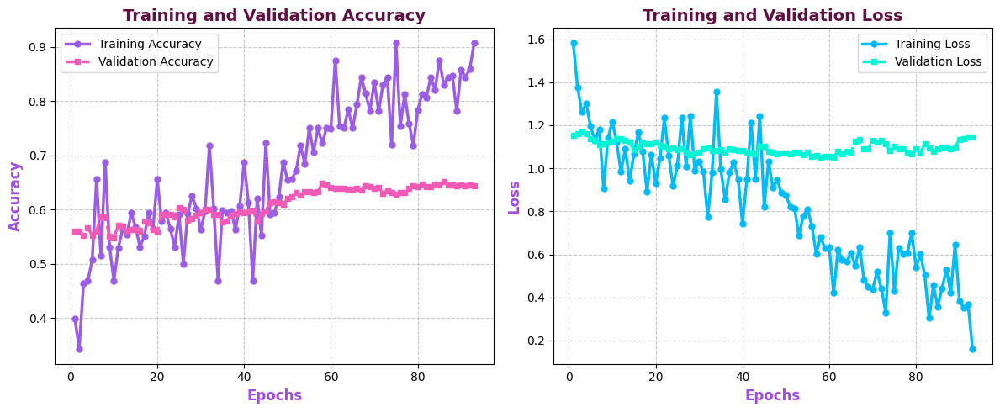

1/1 ━━━━━━━━━━━━━━━━━━━━ 19s 19s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 102s 102s/step

densenet121 Classification Report:
                precision    recall  f1-score   support

         clear       0.70      0.85      0.77       120
        comedo       0.79      0.53      0.64       120
 nodule-cystic       0.86      0.71      0.78        42
         other       0.87      0.72      0.79       120
papulo-pustula       0.60      0

In [ ]:
densenet_model, base_densenet_model, densenet_name = create_densenet_model()
densenet_model, densenet_history, densenet_results = train_model_with_fine_tuning(
    densenet_model, base_densenet_model, densenet_name, train_generator, val_generator, test_generator
)

# Pytorch


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 922.2/922.2 kB 24.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 32.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 24.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 23.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 18.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 58.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [ ]:
zip_path = '/content/drive/MyDrive/augmented.7z'

In [ ]:
!apt-get install -y p7zip-full

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
p7zip-full is already the newest version (16.02+dfsg-8).
0 upgraded, 0 newly installed, 0 to remove and 29 not upgraded.


In [ ]:
extract_path = '/content/dataset'

In [ ]:
!7z x "{zip_path}" -o"{extract_path}" -y



7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.00GHz (50653),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan /content/drive/MyDrive/                                 1 file, 60503973 bytes (58 MiB)

Extracting archive: /content/drive/MyDrive/augmented.7z
--
Path = /content/drive/MyDrive/augmented.7z
Type = 7z
Physical Size = 60503973
Headers Size = 46426
Method = LZMA2:25
Solid = +
Blocks = 1

  0%      5% 12         9% 329 - acne-augmented-test/nodule-cystic/nodule_cystic_55.jpg                                                                  11% 330 - acne-augmented-test/nodule-cystic/nodule_cystic_56.jpg

In [ ]:
import os
import shutil

train_src = "/content/dataset/acne-augmented-train"
test_src = "/content/dataset/acne-augmented-test"

yolo_train = "/content/dataset-yolo/train"
yolo_test = "/content/dataset-yolo/test"

os.makedirs(yolo_train, exist_ok=True)
os.makedirs(yolo_test, exist_ok=True)

def convert_to_yolo_format(src, dest):
    for class_name in os.listdir(src):
        class_src_path = os.path.join(src, class_name)
        class_dest_path = os.path.join(dest, class_name)

        os.makedirs(class_dest_path, exist_ok=True)

        for file in os.listdir(class_src_path):
            src_file = os.path.join(class_src_path, file)
            dest_file = os.path.join(class_dest_path, file)
            shutil.copy2(src_file, dest_file)

convert_to_yolo_format(train_src, yolo_train)
convert_to_yolo_format(test_src, yolo_test)

In [ ]:
from ultralytics import YOLO


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
yolo8n_model = YOLO("yolov8n-cls.pt")

In [ ]:
yolo8n_model.train(data='/content/dataset-yolo', val=True, epochs=50, imgsz=224, batch=32)

Ultralytics 8.3.84 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=classify, mode=train, model=yolov8n-cls.pt, data=/content/dataset-yolo, epochs=50, time=None, patience=100, batch=32, imgsz=224, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_box

100%|██████████| 5.35M/5.35M [00:00<00:00, 111MB/s]


AMP: checks passed ✅


train: Scanning /content/dataset-yolo/train... 4542 images, 0 corrupt: 100%|██████████| 4542/4542 [00:00<00:00, 5767.25it/s]

train: New cache created: /content/dataset-yolo/train.cache



val: Scanning /content/dataset-yolo/test... 576 images, 0 corrupt: 100%|██████████| 576/576 [00:00<00:00, 4296.15it/s]

val: New cache created: /content/dataset-yolo/test.cache


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 26 weight(decay=0.0), 27 weight(decay=0.0005), 27 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 224 train, 224 val
Using 2 dataloader workers
Logging results to runs/classify/train2
Starting training for 50 epochs...

      Epoch    GPU_mem       loss  Instances       Size


       1/50     0.406G      1.605         32        224:   4%|▎         | 5/142 [00:01<00:25,  5.47it/s]

       1/50     0.426G       1.65         32        224:   6%|▌         | 8/142 [00:02<00:25,  5.28it/s]
100%|██████████| 755k/755k [00:00<00:00, 22.0MB/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.91it/s]

                   all        0.7          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.21it/s]

                   all      0.694          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:00<00:00,  9.23it/s]

                   all      0.644          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.27it/s]

                   all      0.641          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  5.49it/s]

                   all      0.736          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.52it/s]

                   all      0.705          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:02<00:00,  4.35it/s]

                   all      0.689          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  5.17it/s]

                   all      0.719          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.97it/s]

                   all      0.689          1



      Epoch    GPU_mem       loss  Instances       Size


      10/50     0.373G     0.3514         30        224: 100%|██████████| 142/142 [00:24<00:00,  5.73it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:00<00:00,  9.58it/s]

                   all      0.708          1



      Epoch    GPU_mem       loss  Instances       Size


      11/50     0.371G     0.3382         30        224: 100%|██████████| 142/142 [00:28<00:00,  5.01it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  5.44it/s]

                   all      0.712          1



      Epoch    GPU_mem       loss  Instances       Size


      12/50     0.373G     0.2877         30        224: 100%|██████████| 142/142 [00:31<00:00,  4.50it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.16it/s]

                   all      0.757          1



      Epoch    GPU_mem       loss  Instances       Size


      13/50     0.373G     0.2685         30        224: 100%|██████████| 142/142 [00:23<00:00,  6.10it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:02<00:00,  4.32it/s]

                   all      0.722          1



      Epoch    GPU_mem       loss  Instances       Size


      14/50     0.373G     0.2532         30        224: 100%|██████████| 142/142 [00:24<00:00,  5.74it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  4.52it/s]

                   all       0.74          1



      Epoch    GPU_mem       loss  Instances       Size


      15/50     0.371G     0.2597         30        224: 100%|██████████| 142/142 [00:23<00:00,  6.06it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.95it/s]

                   all      0.726          1



      Epoch    GPU_mem       loss  Instances       Size


      16/50     0.373G     0.2504         30        224: 100%|██████████| 142/142 [00:25<00:00,  5.67it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.38it/s]

                   all      0.698          1



      Epoch    GPU_mem       loss  Instances       Size


      17/50     0.371G     0.2403         30        224: 100%|██████████| 142/142 [00:24<00:00,  5.77it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.41it/s]

                   all      0.733          1



      Epoch    GPU_mem       loss  Instances       Size


      18/50     0.371G     0.2374         30        224: 100%|██████████| 142/142 [00:24<00:00,  5.76it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.43it/s]

                   all      0.778          1



      Epoch    GPU_mem       loss  Instances       Size


      19/50     0.373G      0.216         30        224: 100%|██████████| 142/142 [00:25<00:00,  5.68it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.28it/s]

                   all      0.717          1



      Epoch    GPU_mem       loss  Instances       Size


      20/50     0.373G     0.1861         30        224: 100%|██████████| 142/142 [00:25<00:00,  5.59it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.30it/s]

                   all      0.752          1



      Epoch    GPU_mem       loss  Instances       Size


      21/50     0.373G     0.1903         30        224: 100%|██████████| 142/142 [00:24<00:00,  5.84it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  5.54it/s]

                   all       0.76          1



      Epoch    GPU_mem       loss  Instances       Size


      22/50     0.371G     0.1856         30        224: 100%|██████████| 142/142 [00:23<00:00,  6.09it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  4.94it/s]

                   all      0.729          1



      Epoch    GPU_mem       loss  Instances       Size


      23/50     0.371G     0.1681         30        224: 100%|██████████| 142/142 [00:25<00:00,  5.66it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  5.39it/s]

                   all      0.722          1



      Epoch    GPU_mem       loss  Instances       Size


      24/50     0.373G     0.1611         30        224: 100%|██████████| 142/142 [00:23<00:00,  5.96it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.17it/s]


                   all      0.736          1

      Epoch    GPU_mem       loss  Instances       Size


      25/50     0.371G     0.1572         30        224: 100%|██████████| 142/142 [00:24<00:00,  5.80it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  6.94it/s]

                   all      0.738          1



      Epoch    GPU_mem       loss  Instances       Size


      26/50     0.371G      0.158         30        224: 100%|██████████| 142/142 [00:24<00:00,  5.78it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.23it/s]

                   all        0.7          1



      Epoch    GPU_mem       loss  Instances       Size


      27/50     0.371G     0.1398         30        224: 100%|██████████| 142/142 [00:24<00:00,  5.73it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.00it/s]

                   all      0.712          1



      Epoch    GPU_mem       loss  Instances       Size


      28/50     0.373G     0.1417         30        224: 100%|██████████| 142/142 [00:24<00:00,  5.72it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.39it/s]

                   all      0.752          1



      Epoch    GPU_mem       loss  Instances       Size


      29/50     0.371G     0.1257         30        224: 100%|██████████| 142/142 [00:23<00:00,  5.97it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  4.75it/s]

                   all      0.705          1



      Epoch    GPU_mem       loss  Instances       Size


      30/50     0.373G     0.1213         30        224: 100%|██████████| 142/142 [00:23<00:00,  6.04it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:02<00:00,  4.48it/s]

                   all      0.714          1



      Epoch    GPU_mem       loss  Instances       Size


      31/50     0.371G     0.1235         30        224: 100%|██████████| 142/142 [00:23<00:00,  6.04it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  6.92it/s]

                   all       0.71          1



      Epoch    GPU_mem       loss  Instances       Size


      32/50     0.373G     0.1194         30        224: 100%|██████████| 142/142 [00:24<00:00,  5.79it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.44it/s]

                   all      0.719          1



      Epoch    GPU_mem       loss  Instances       Size


      33/50     0.373G     0.1104         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.33it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.98it/s]

                   all       0.72          1



      Epoch    GPU_mem       loss  Instances       Size


      34/50     0.373G     0.1127         30        224: 100%|██████████| 142/142 [00:25<00:00,  5.66it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.77it/s]

                   all       0.75          1



      Epoch    GPU_mem       loss  Instances       Size


      35/50     0.373G     0.1141         30        224: 100%|██████████| 142/142 [00:24<00:00,  5.69it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.23it/s]


                   all      0.726          1

      Epoch    GPU_mem       loss  Instances       Size


      36/50     0.373G     0.1063         30        224: 100%|██████████| 142/142 [00:24<00:00,  5.71it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.16it/s]

                   all      0.729          1



      Epoch    GPU_mem       loss  Instances       Size


      37/50     0.371G    0.09939         30        224: 100%|██████████| 142/142 [00:24<00:00,  5.76it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  6.72it/s]

                   all      0.724          1



      Epoch    GPU_mem       loss  Instances       Size


      38/50     0.371G     0.1013         30        224: 100%|██████████| 142/142 [00:23<00:00,  6.07it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  5.24it/s]

                   all       0.72          1



      Epoch    GPU_mem       loss  Instances       Size


      39/50     0.373G    0.08846         30        224: 100%|██████████| 142/142 [00:23<00:00,  6.02it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.03it/s]

                   all      0.734          1



      Epoch    GPU_mem       loss  Instances       Size


      40/50     0.373G    0.09323         30        224: 100%|██████████| 142/142 [00:24<00:00,  5.75it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.22it/s]

                   all      0.731          1



      Epoch    GPU_mem       loss  Instances       Size


      41/50     0.371G    0.08978         30        224: 100%|██████████| 142/142 [00:24<00:00,  5.76it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.17it/s]

                   all      0.726          1



      Epoch    GPU_mem       loss  Instances       Size


      42/50     0.373G    0.08748         30        224: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.43it/s]

                   all      0.722          1



      Epoch    GPU_mem       loss  Instances       Size


      43/50     0.371G    0.07275         30        224: 100%|██████████| 142/142 [00:37<00:00,  3.75it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.40it/s]

                   all      0.727          1



      Epoch    GPU_mem       loss  Instances       Size


      44/50     0.371G    0.06948         30        224: 100%|██████████| 142/142 [00:24<00:00,  5.91it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  6.89it/s]

                   all      0.729          1



      Epoch    GPU_mem       loss  Instances       Size


      45/50     0.373G    0.07758         30        224: 100%|██████████| 142/142 [00:22<00:00,  6.34it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  4.58it/s]

                   all      0.726          1



      Epoch    GPU_mem       loss  Instances       Size


      46/50     0.373G    0.07617         30        224: 100%|██████████| 142/142 [00:23<00:00,  6.15it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:00<00:00,  9.42it/s]

                   all      0.729          1



      Epoch    GPU_mem       loss  Instances       Size


      47/50     0.371G     0.0701         30        224: 100%|██████████| 142/142 [00:24<00:00,  5.85it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.74it/s]

                   all      0.731          1



      Epoch    GPU_mem       loss  Instances       Size


      48/50     0.371G     0.0696         30        224: 100%|██████████| 142/142 [00:24<00:00,  5.85it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.38it/s]

                   all      0.745          1



      Epoch    GPU_mem       loss  Instances       Size


      49/50     0.373G    0.07293         30        224: 100%|██████████| 142/142 [00:24<00:00,  5.82it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.66it/s]

                   all      0.736          1



      Epoch    GPU_mem       loss  Instances       Size


      50/50     0.373G    0.06526         30        224: 100%|██████████| 142/142 [00:23<00:00,  6.02it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  4.94it/s]

                   all      0.733          1



50 epochs completed in 0.380 hours.
Optimizer stripped from runs/classify/train2/weights/last.pt, 3.0MB
Optimizer stripped from runs/classify/train2/weights/best.pt, 3.0MB

Validating runs/classify/train2/weights/best.pt...
Ultralytics 8.3.84 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n-cls summary (fused): 30 layers, 1,441,285 parameters, 0 gradients, 3.3 GFLOPs
WARNING ⚠️ Dataset 'split=val' not found, using 'split=test' instead.
train: /content/dataset-yolo/train... found 4542 images in 5 classes ✅ 
val: None...
test: /content/dataset-yolo/test... found 576 images in 5 classes ✅ 


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.45it/s]


                   all      0.783          1
Speed: 0.2ms preprocess, 0.3ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to runs/classify/train2


ultralytics.utils.metrics.ClassifyMetrics object with attributes:

confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7fa5a2148c10>
curves: []
curves_results: []
fitness: 0.8914930522441864
keys: ['metrics/accuracy_top1', 'metrics/accuracy_top5']
results_dict: {'metrics/accuracy_top1': 0.7829861044883728, 'metrics/accuracy_top5': 1.0, 'fitness': 0.8914930522441864}
save_dir: PosixPath('runs/classify/train2')
speed: {'preprocess': 0.15630188020862887, 'inference': 0.2763058263902786, 'loss': 0.0001900781256836126, 'postprocess': 0.0003255954842037075}
task: 'classify'
top1: 0.7829861044883728
top5: 1.0

In [ ]:
num_params = sum(p.numel() for p in yolo8n_model.model.parameters())
num_params

1444693

In [ ]:
import shutil

model_src_path = "runs/classify/train/weights/best.pt"
model_dest_path = "/content/drive/MyDrive/acne_models/"
os.makedirs(model_dest_path, exist_ok=True)

shutil.copy(model_src_path, model_dest_path)
os.rename(model_dest_path + '/best.pt', model_dest_path + '/yolo8m_model.pt')

In [ ]:
import gc
import torch
del yolo8n_model
torch.cuda.empty_cache()
gc.collect()

27097

In [ ]:
yolo8s_model = YOLO("yolov8s-cls.pt")

100%|██████████| 12.3M/12.3M [00:00<00:00, 99.8MB/s]


In [ ]:
yolo8s_model.train(data='/content/dataset-yolo', val=True, epochs=50, imgsz=224, batch=32)

Ultralytics 8.3.84 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=classify, mode=train, model=yolov8s-cls.pt, data=/content/dataset-yolo, epochs=50, time=None, patience=100, batch=32, imgsz=224, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxe

100%|██████████| 5.35M/5.35M [00:00<00:00, 95.8MB/s]


AMP: checks passed ✅


train: Scanning /content/dataset-yolo/train... 4542 images, 0 corrupt: 100%|██████████| 4542/4542 [00:00<00:00, 5641.17it/s]


train: New cache created: /content/dataset-yolo/train.cache


val: Scanning /content/dataset-yolo/test... 576 images, 0 corrupt: 100%|██████████| 576/576 [00:00<00:00, 4606.01it/s]

val: New cache created: /content/dataset-yolo/test.cache


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 26 weight(decay=0.0), 27 weight(decay=0.0005), 27 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 224 train, 224 val
Using 2 dataloader workers
Logging results to runs/classify/train
Starting training for 50 epochs...

      Epoch    GPU_mem       loss  Instances       Size


       1/50     0.736G      1.671         32        224:   4%|▎         | 5/142 [00:01<00:32,  4.27it/s]

       1/50     0.736G      1.676         32        224:   5%|▍         | 7/142 [00:02<00:30,  4.47it/s]
100%|██████████| 755k/755k [00:00<00:00, 26.8MB/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:00<00:00, 10.58it/s]

                   all      0.665          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:02<00:00,  4.48it/s]

                   all       0.72          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.73it/s]


                   all      0.642          1

      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.35it/s]

                   all      0.703          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.93it/s]

                   all      0.752          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.13it/s]

                   all      0.755          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.33it/s]

                   all      0.719          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.75it/s]

                   all      0.712          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.06it/s]

                   all       0.75          1



      Epoch    GPU_mem       loss  Instances       Size


      10/50     0.736G     0.2824         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.33it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.74it/s]

                   all      0.767          1



      Epoch    GPU_mem       loss  Instances       Size


      11/50     0.736G       0.27         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.38it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.49it/s]

                   all      0.738          1



      Epoch    GPU_mem       loss  Instances       Size


      12/50     0.736G      0.229         30        224: 100%|██████████| 142/142 [00:28<00:00,  5.04it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.59it/s]

                   all      0.759          1



      Epoch    GPU_mem       loss  Instances       Size


      13/50     0.736G     0.2427         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.40it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.94it/s]

                   all      0.734          1



      Epoch    GPU_mem       loss  Instances       Size


      14/50     0.738G     0.1967         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.40it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.64it/s]

                   all       0.72          1



      Epoch    GPU_mem       loss  Instances       Size


      15/50     0.736G     0.1981         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.35it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.05it/s]

                   all      0.741          1



      Epoch    GPU_mem       loss  Instances       Size


      16/50     0.736G     0.2015         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.32it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.21it/s]

                   all       0.75          1



      Epoch    GPU_mem       loss  Instances       Size


      17/50     0.738G     0.1826         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.38it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.23it/s]

                   all      0.727          1



      Epoch    GPU_mem       loss  Instances       Size


      18/50     0.736G     0.1811         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.35it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.12it/s]

                   all      0.753          1



      Epoch    GPU_mem       loss  Instances       Size


      19/50     0.736G       0.14         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.42it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.24it/s]

                   all      0.759          1



      Epoch    GPU_mem       loss  Instances       Size


      20/50     0.736G     0.1379         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.39it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.07it/s]

                   all      0.733          1



      Epoch    GPU_mem       loss  Instances       Size


      21/50     0.736G     0.1342         30        224: 100%|██████████| 142/142 [00:27<00:00,  5.10it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.02it/s]

                   all      0.727          1



      Epoch    GPU_mem       loss  Instances       Size


      22/50     0.736G     0.1271         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.36it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.82it/s]

                   all      0.734          1



      Epoch    GPU_mem       loss  Instances       Size


      23/50     0.736G     0.1353         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.33it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.81it/s]

                   all      0.745          1



      Epoch    GPU_mem       loss  Instances       Size


      24/50     0.736G     0.1265         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.37it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.57it/s]

                   all      0.757          1



      Epoch    GPU_mem       loss  Instances       Size


      25/50     0.736G     0.1188         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.35it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.97it/s]

                   all      0.748          1



      Epoch    GPU_mem       loss  Instances       Size


      26/50     0.736G     0.1143         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.32it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.42it/s]

                   all       0.72          1



      Epoch    GPU_mem       loss  Instances       Size


      27/50     0.738G     0.1055         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.44it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  6.83it/s]

                   all      0.748          1



      Epoch    GPU_mem       loss  Instances       Size


      28/50     0.738G    0.09968         30        224: 100%|██████████| 142/142 [00:25<00:00,  5.53it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  5.04it/s]

                   all      0.773          1



      Epoch    GPU_mem       loss  Instances       Size


      29/50     0.738G    0.09081         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.43it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:02<00:00,  4.43it/s]

                   all      0.733          1



      Epoch    GPU_mem       loss  Instances       Size


      30/50     0.738G    0.09093         30        224: 100%|██████████| 142/142 [00:29<00:00,  4.90it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:00<00:00,  9.10it/s]

                   all      0.734          1



      Epoch    GPU_mem       loss  Instances       Size


      31/50     0.738G    0.08453         30        224: 100%|██████████| 142/142 [00:27<00:00,  5.24it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:00<00:00,  9.23it/s]

                   all       0.76          1



      Epoch    GPU_mem       loss  Instances       Size


      32/50     0.738G    0.07829         30        224: 100%|██████████| 142/142 [00:27<00:00,  5.24it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.01it/s]

                   all       0.76          1



      Epoch    GPU_mem       loss  Instances       Size


      33/50     0.736G    0.07744         30        224: 100%|██████████| 142/142 [00:27<00:00,  5.24it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.18it/s]

                   all      0.766          1



      Epoch    GPU_mem       loss  Instances       Size


      34/50     0.738G    0.07799         30        224: 100%|██████████| 142/142 [00:27<00:00,  5.25it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.87it/s]

                   all      0.748          1



      Epoch    GPU_mem       loss  Instances       Size


      35/50     0.738G    0.06854         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.28it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.55it/s]

                   all      0.741          1



      Epoch    GPU_mem       loss  Instances       Size


      36/50     0.736G    0.07271         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.27it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.40it/s]

                   all       0.75          1



      Epoch    GPU_mem       loss  Instances       Size


      37/50     0.736G    0.06974         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.29it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.09it/s]

                   all      0.752          1



      Epoch    GPU_mem       loss  Instances       Size


      38/50     0.738G    0.06409         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.29it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.18it/s]

                   all       0.74          1



      Epoch    GPU_mem       loss  Instances       Size


      39/50     0.736G    0.05422         30        224: 100%|██████████| 142/142 [00:28<00:00,  4.97it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  5.10it/s]


                   all      0.738          1

      Epoch    GPU_mem       loss  Instances       Size


      40/50     0.736G    0.05938         30        224: 100%|██████████| 142/142 [00:27<00:00,  5.25it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  6.45it/s]

                   all      0.727          1



      Epoch    GPU_mem       loss  Instances       Size


      41/50     0.736G    0.05617         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.32it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.10it/s]

                   all      0.745          1



      Epoch    GPU_mem       loss  Instances       Size


      42/50     0.736G     0.0536         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.40it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.74it/s]

                   all      0.748          1



      Epoch    GPU_mem       loss  Instances       Size


      43/50     0.736G    0.04633         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.43it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.34it/s]

                   all      0.759          1



      Epoch    GPU_mem       loss  Instances       Size


      44/50     0.736G    0.04354         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.43it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.31it/s]

                   all      0.762          1



      Epoch    GPU_mem       loss  Instances       Size


      45/50     0.736G    0.04832         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.46it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.62it/s]

                   all      0.747          1



      Epoch    GPU_mem       loss  Instances       Size


      46/50     0.736G    0.04038         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.38it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.45it/s]

                   all      0.755          1



      Epoch    GPU_mem       loss  Instances       Size


      47/50     0.736G    0.04331         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.36it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.86it/s]

                   all      0.766          1



      Epoch    GPU_mem       loss  Instances       Size


      48/50     0.736G    0.03795         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.41it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:00<00:00,  9.21it/s]

                   all      0.747          1



      Epoch    GPU_mem       loss  Instances       Size


      49/50     0.738G    0.02925         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.34it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.49it/s]

                   all      0.753          1



      Epoch    GPU_mem       loss  Instances       Size


      50/50     0.738G    0.03289         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.42it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.24it/s]

                   all      0.757          1



50 epochs completed in 0.411 hours.
Optimizer stripped from runs/classify/train/weights/last.pt, 10.3MB
Optimizer stripped from runs/classify/train/weights/best.pt, 10.3MB

Validating runs/classify/train/weights/best.pt...
Ultralytics 8.3.84 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8s-cls summary (fused): 30 layers, 5,081,605 parameters, 0 gradients, 12.5 GFLOPs
WARNING ⚠️ Dataset 'split=val' not found, using 'split=test' instead.
train: /content/dataset-yolo/train... found 4542 images in 5 classes ✅ 
val: None...
test: /content/dataset-yolo/test... found 576 images in 5 classes ✅ 


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.85it/s]


                   all      0.771          1
Speed: 0.1ms preprocess, 0.5ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to runs/classify/train


ultralytics.utils.metrics.ClassifyMetrics object with attributes:

confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a2a2b30add0>
curves: []
curves_results: []
fitness: 0.8854166567325592
keys: ['metrics/accuracy_top1', 'metrics/accuracy_top5']
results_dict: {'metrics/accuracy_top1': 0.7708333134651184, 'metrics/accuracy_top5': 1.0, 'fitness': 0.8854166567325592}
save_dir: PosixPath('runs/classify/train')
speed: {'preprocess': 0.13668753993082797, 'inference': 0.49208758159598653, 'loss': 0.016071986109977843, 'postprocess': 0.0038287795168419807}
task: 'classify'
top1: 0.7708333134651184
top5: 1.0

In [ ]:
num_params = sum(p.numel() for p in yolo8s_model.model.parameters())
num_params

5087141

In [ ]:
import gc
import torch
del yolo8s_model
torch.cuda.empty_cache()
gc.collect()

10

In [ ]:
yolo8s_model = None

In [ ]:
yolo8m_model = YOLO("yolov8m-cls.pt")

100%|██████████| 32.7M/32.7M [00:00<00:00, 45.2MB/s]


In [ ]:
yolo8m_model.train(data='/content/dataset-yolo', val=True, epochs=25, imgsz=224, batch=32)

Ultralytics 8.3.84 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=classify, mode=train, model=yolov8m-cls.pt, data=/content/dataset-yolo, epochs=25, time=None, patience=100, batch=32, imgsz=224, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_box

train: Scanning /content/dataset-yolo/train... 4542 images, 0 corrupt: 100%|██████████| 4542/4542 [00:00<?, ?it/s]
val: Scanning /content/dataset-yolo/test... 576 images, 0 corrupt: 100%|██████████| 576/576 [00:00<?, ?it/s]


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 38 weight(decay=0.0), 39 weight(decay=0.0005), 39 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 224 train, 224 val
Using 2 dataloader workers
Logging results to runs/classify/train2
Starting training for 25 epochs...

      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.40it/s]

                   all      0.726          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.29it/s]

                   all      0.743          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.27it/s]

                   all      0.729          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.63it/s]

                   all      0.724          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.99it/s]

                   all      0.752          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  5.61it/s]

                   all      0.766          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.98it/s]

                   all      0.747          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.52it/s]

                   all      0.698          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  6.42it/s]

                   all      0.757          1



      Epoch    GPU_mem       loss  Instances       Size


      10/25      1.45G     0.2289         30        224: 100%|██████████| 142/142 [00:27<00:00,  5.13it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.91it/s]

                   all      0.785          1



      Epoch    GPU_mem       loss  Instances       Size


      11/25      1.44G     0.2179         30        224: 100%|██████████| 142/142 [00:29<00:00,  4.84it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.63it/s]

                   all      0.759          1



      Epoch    GPU_mem       loss  Instances       Size


      12/25      1.45G     0.1815         30        224: 100%|██████████| 142/142 [00:27<00:00,  5.15it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.29it/s]

                   all      0.781          1



      Epoch    GPU_mem       loss  Instances       Size


      13/25      1.44G     0.1777         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.35it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  4.55it/s]

                   all      0.774          1



      Epoch    GPU_mem       loss  Instances       Size


      14/25      1.45G     0.1385         30        224: 100%|██████████| 142/142 [00:27<00:00,  5.16it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.72it/s]

                   all      0.804          1



      Epoch    GPU_mem       loss  Instances       Size


      15/25       1.5G      0.125         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.31it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:02<00:00,  4.39it/s]

                   all      0.771          1



      Epoch    GPU_mem       loss  Instances       Size


      16/25      1.44G      0.127         30        224: 100%|██████████| 142/142 [00:28<00:00,  5.05it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.74it/s]

                   all      0.792          1



      Epoch    GPU_mem       loss  Instances       Size


      17/25      1.44G     0.1247         30        224: 100%|██████████| 142/142 [00:27<00:00,  5.26it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  6.32it/s]

                   all      0.757          1



      Epoch    GPU_mem       loss  Instances       Size


      18/25      1.44G    0.09436         30        224: 100%|██████████| 142/142 [00:29<00:00,  4.82it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.19it/s]

                   all      0.766          1



      Epoch    GPU_mem       loss  Instances       Size


      19/25      1.44G    0.08932         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.26it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  5.16it/s]

                   all      0.767          1



      Epoch    GPU_mem       loss  Instances       Size


      20/25      1.44G    0.08674         30        224: 100%|██████████| 142/142 [00:27<00:00,  5.19it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.95it/s]

                   all      0.769          1



      Epoch    GPU_mem       loss  Instances       Size


      21/25      1.44G    0.06497         30        224: 100%|██████████| 142/142 [00:27<00:00,  5.19it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.49it/s]

                   all      0.774          1



      Epoch    GPU_mem       loss  Instances       Size


      22/25      1.44G    0.06767         30        224: 100%|██████████| 142/142 [00:27<00:00,  5.18it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.82it/s]

                   all      0.786          1



      Epoch    GPU_mem       loss  Instances       Size


      23/25      1.45G    0.07273         30        224: 100%|██████████| 142/142 [00:26<00:00,  5.27it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  4.97it/s]

                   all      0.769          1



      Epoch    GPU_mem       loss  Instances       Size


      24/25      1.44G    0.05775         30        224: 100%|██████████| 142/142 [00:27<00:00,  5.15it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.66it/s]

                   all       0.78          1



      Epoch    GPU_mem       loss  Instances       Size


      25/25      1.44G    0.05864         30        224: 100%|██████████| 142/142 [00:27<00:00,  5.13it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  8.20it/s]

                   all      0.771          1



25 epochs completed in 0.241 hours.
Optimizer stripped from runs/classify/train2/weights/last.pt, 31.7MB
Optimizer stripped from runs/classify/train2/weights/best.pt, 31.7MB

Validating runs/classify/train2/weights/best.pt...
Ultralytics 8.3.84 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8m-cls summary (fused): 42 layers, 15,769,061 parameters, 0 gradients, 41.6 GFLOPs
WARNING ⚠️ Dataset 'split=val' not found, using 'split=test' instead.
train: /content/dataset-yolo/train... found 4542 images in 5 classes ✅ 
val: None...
test: /content/dataset-yolo/test... found 576 images in 5 classes ✅ 


               classes   top1_acc   top5_acc: 100%|██████████| 9/9 [00:01<00:00,  7.95it/s]


                   all      0.804          1
Speed: 0.1ms preprocess, 1.1ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to runs/classify/train2


ultralytics.utils.metrics.ClassifyMetrics object with attributes:

confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a2aca59b290>
curves: []
curves_results: []
fitness: 0.9019097089767456
keys: ['metrics/accuracy_top1', 'metrics/accuracy_top5']
results_dict: {'metrics/accuracy_top1': 0.8038194179534912, 'metrics/accuracy_top5': 1.0, 'fitness': 0.9019097089767456}
save_dir: PosixPath('runs/classify/train2')
speed: {'preprocess': 0.11952975867757232, 'inference': 1.0769678715294935, 'loss': 0.0016116059021619043, 'postprocess': 0.0005899045163459959}
task: 'classify'
top1: 0.8038194179534912
top5: 1.0

In [ ]:
model_path = "/content/drive/MyDrive/acne_models/yolo8s_model.pt"
imported_model = YOLO(model_path)

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


image 1/1 /content/dataset-yolo/test/other/other_40.jpg: 224x224 other 0.96, clear 0.02, nodule-cystic 0.02, comedo 0.00, papulo-pustula 0.00, 28.3ms
Speed: 25.7ms preprocess, 28.3ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)

image 1/1 /content/dataset-yolo/test/other/other_5.jpg: 224x224 other 1.00, nodule-cystic 0.00, comedo 0.00, clear 0.00, papulo-pustula 0.00, 40.0ms
Speed: 2.6ms preprocess, 40.0ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)

image 1/1 /content/dataset-yolo/test/other/other_41.jpg: 224x224 other 0.91, clear 0.06, nodule-cystic 0.03, comedo 0.00, papulo-pustula 0.00, 71.1ms
Speed: 5.8ms preprocess, 71.1ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)

image 1/1 /content/dataset-yolo/test/other/other_57.jpg: 224x224 other 0.85, clear 0.12, nodule-cystic 0.03, papulo-pustula 0.00, comedo 0.00, 40.8ms
Speed: 5.6ms preprocess, 40.8ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)

image 1

,Image Path,True Label,Predicted Label,Confidence
0,/content/dataset-yolo/test/other/other_25.jpg,other,comedo,"tensor(0.6644, device='cuda:0')"
1,/content/dataset-yolo/test/other/other_84.jpg,other,nodule-cystic,"tensor(0.6611, device='cuda:0')"
2,/content/dataset-yolo/test/other/other_14.jpg,other,nodule-cystic,"tensor(0.9988, device='cuda:0')"
3,/content/dataset-yolo/test/other/other_13.jpg,other,nodule-cystic,"tensor(0.9973, device='cuda:0')"
4,/content/dataset-yolo/test/other/other_22.jpg,other,clear,"tensor(0.8397, device='cuda:0')"
...,...,...,...,...
127,/content/dataset-yolo/test/clear/clear_125.jpg,clear,comedo,"tensor(0.5661, device='cuda:0')"
128,/content/dataset-yolo/test/clear/clear_59.jpg,clear,comedo,"tensor(0.6976, device='cuda:0')"
129,/content/dataset-yolo/test/clear/clear_124.jpg,clear,comedo,"tensor(0.9751, device='cuda:0')"
130,/content/dataset-yolo/test/clear/clear_17.jpg,clear,papulo-pustula,"tensor(0.9904, device='cuda:0')"


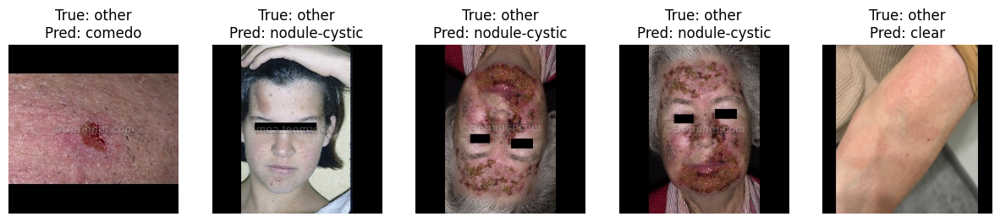

In [ ]:
misclassified_samples = []

for true_class in os.listdir(yolo_test):
    folder_path = os.path.join(yolo_test, true_class)
    if os.path.isdir(folder_path):
        for filename in os.listdir(folder_path):
            if filename.lower().endswith((".png", ".jpg", ".jpeg")):
                img_path = os.path.join(folder_path, filename)

                results = imported_model.predict(source=img_path, show=False)
                result = results[0]

                if not hasattr(result, "probs"):
                  print('ERROR')
                  break
                probs = result.probs
                pred_index = probs.top1
                pred_label = imported_model.names[pred_index]
                confidence = probs.top1conf

                if pred_label != true_class:
                    misclassified_samples.append({
                        "Image Path": img_path,
                        "True Label": true_class,
                        "Predicted Label": pred_label,
                        "Confidence": confidence
                    })

df = pd.DataFrame(misclassified_samples)
display(df)

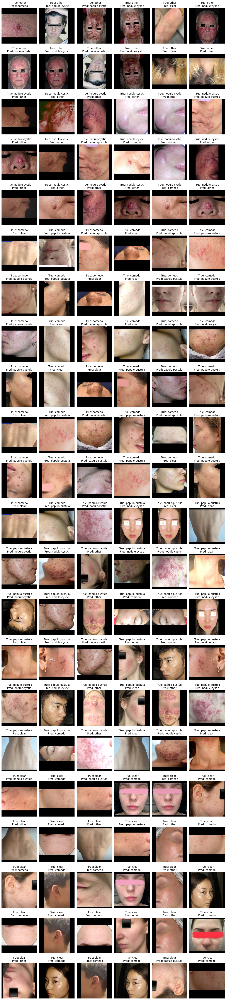

In [ ]:
import math
num_images = len(df)

cols = 6
rows = math.ceil(num_images / cols)

fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3))
axes = axes.flatten()

for i in range(num_images):
    img = mpimg.imread(df["Image Path"].iloc[i])
    axes[i].imshow(img)
    axes[i].axis("off")
    axes[i].set_title(f"True: {df['True Label'].iloc[i]}\nPred: {df['Predicted Label'].iloc[i]}")

for j in range(num_images, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()